In [2]:
source("../wwa_model-fitting.R")

- look at conditional dependence between regions - how unusual was it for this widespread a region to have high DSR simultaneously? (use a copula?)
- OR could look at FWI peaks over threshold - changes in distribution - was this year unusual in terms of the frequency or intensity of extreme fire weather?

---
# **Check distribution of cumDSR**

In [198]:
# load all the .csv files into a single list and merge into a dataframe
df_list <- sapply(list.files("ts", pattern = "cumDSR-fs", full.names = T), function(fnm) read.csv(fnm, col.names = c("year", gsub(".csv", "", strsplit(fnm, "_")[[1]][3]))), simplify = F)
df = cbind("year" = df_list[[1]][,"year"], do.call("cbind", lapply(df_list, "[",-1)))

## **KDE**

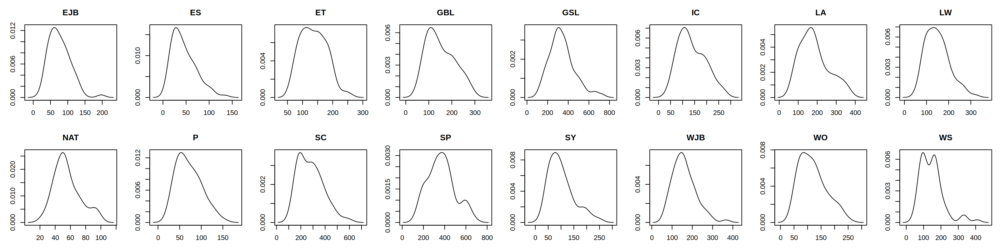

In [72]:
# KDE of raw data (KS tests don't reject normality but data is clearly skewed & would benefit from transformation)
prep_window(c(1,4)); par(mfrow = c(2,8), mar = c(3,3,3,1))
for (cnm in colnames(df)[-1]) {
    x <- df[,cnm]
    plot(density(x), main = cnm, xlab = "", ylab = "")
}

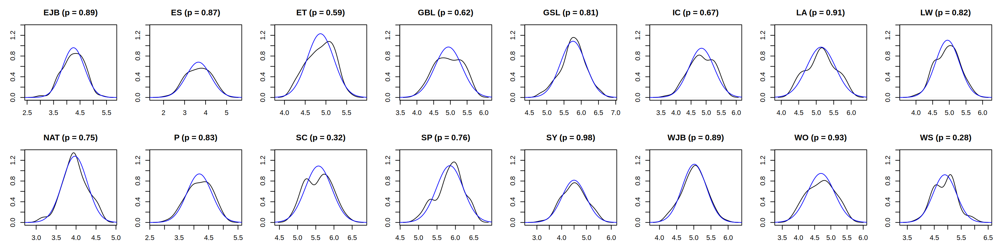

In [75]:
# KDE of log-transformed data - skewness has been removed, looks much better
prep_window(c(1,4)); par(mfrow = c(2,8), mar = c(3,3,3,1))
for (cnm in colnames(df)[-1]) {
    x <- log(df[,cnm])
    plot(density(x), main = paste0(cnm, " (p = ",round(ks.test(scale(x), pnorm)$p, 2),")"), xlab = "", ylab = "", ylim = c(0,1.35))
    lines(seq(0,10,0.01), dnorm(seq(0,10,0.01), mean(x), sd(x)), col = "blue")
}

Typically, a log-normal process is assumed to be the statistical realization of the multiplicative product of many independent random variables.  
However, in this case, we have $DSR = 0.0272 FWI^{1.77}$, so it's not clear how to simplify the summation:  
\begin{align}cumDSR = 0.0272 \sum_d FWI_d^{1.77}
\end{align}
However, we do know that a log-transformed power function becomes a linear function (ie. $\log{ax^b} = \log{a} + b\log{x}$)... could this be useful?

## **Relationships between cumDSR across HFRZs**

In [902]:
df_list <- sapply(list.files("ts", pattern = "cumDSR-fs", full.names = T), function(fnm) read.csv(fnm, col.names = c("year", gsub(".csv", "", strsplit(fnm, "_")[[1]][3]))), simplify = F)
df = do.call("cbind", lapply(df_list, "[",-1))
                  
panel.cor <- function(x, y, digits = 2,...) {
    usr <- par("usr")
    par(usr = c(0, 1, 0, 1))
    r <- cor(x, y)
    txt <- round(r, digits)
    cex.cor <- 1
    r_col <- c("blue", "cornflowerblue", "turquoise", "yellow", "orange", "red4", "magenta")[findInterval(r, c(-1,-0.7,-0.4,-0.1,0.1,0.4,0.7,1))]
    text(0.5, 0.5, txt, cex = cex.cor, col = r_col, font = 2)
    par(usr = usr)
}

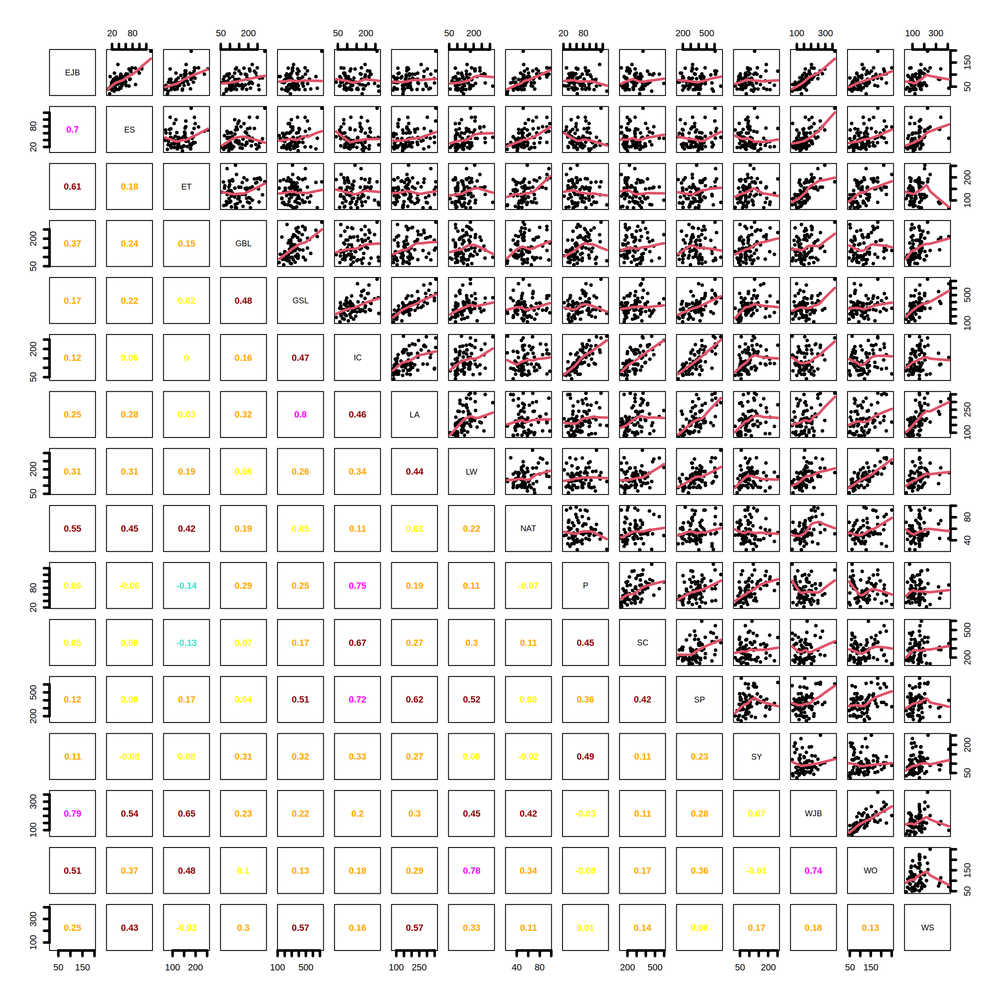

In [903]:
prep_window(c(3,3))
pairs(df, upper.panel = panel.smooth, lower.panel = panel.cor, lwd = 3)

In [900]:
?pairs

pairs {graphics},R Documentation
x,the coordinates of points given as numeric columns of a matrix or data frame. Logical and factor columns are converted to numeric in the same way that data.matrix does.
formula,"a formula, such as ~ x + y + z. Each term will give a separate variable in the pairs plot, so terms should be numeric vectors. (A response will be interpreted as another variable, but not treated specially, so it is confusing to use one.)"
data,a data.frame (or list) from which the variables in formula should be taken.
subset,an optional vector specifying a subset of observations to be used for plotting.
na.action,"a function which indicates what should happen when the data contain NAs. The default is to pass missing values on to the panel functions, but na.action = na.omit will cause cases with missing values in any of the variables to be omitted entirely."
labels,the names of the variables.
panel,"function(x, y, ...) which is used to plot the contents of each panel of the display."
...,"arguments to be passed to or from methods. Also, graphical parameters can be given as can arguments to plot such as main. par(""oma"") will be set appropriately unless specified."
"horInd, verInd",The (numerical) indices of the variables to be plotted on the horizontal and vertical axes respectively.
"lower.panel, upper.panel",separate panel functions (or NULL) to be used below and above the diagonal respectively.


## **Tail dependence in daily DSR between HFRZs**

In [839]:
library("extRemes")

In [836]:
# load daily data
df = read.csv("data/era5_dsr_daily.csv")
df <- df[substr(df$time,1,4) >= 1950,]

In [892]:
# check choice of threshold
sapply(seq(0.95,0.99,0.01), function(u) taildep(df[,"EJB"], df[,"ES"], u = u))

chi,0.4555741,0.4219996,0.3784085,0.3505843,0.3116305
chibar,0.5842350,0.5772515,0.5660082,0.5773723,0.5959399


In [895]:
taildep.test(df[,"EJB"], df[,"ES"])


	Reiss-Thomas (13.35)

data:  df[, "EJB"]df[, "ES"]
statistic = -14.05, threshold = -0.5, m = 6463.0, n = 26955.0,
exceedance rate (%) = 24.0, p-value < 2.2e-16
alternative hypothesis: less


In [850]:
chi2 <- sapply(colnames(df)[-1], function(zx) {
    sapply(colnames(df)[-1], function(zy) {
        taildep(df[,zx], df[,zy], u = 0.99)
    })
}, simplify = F)
chi2 <- abind(chi2, rev.along = 0)

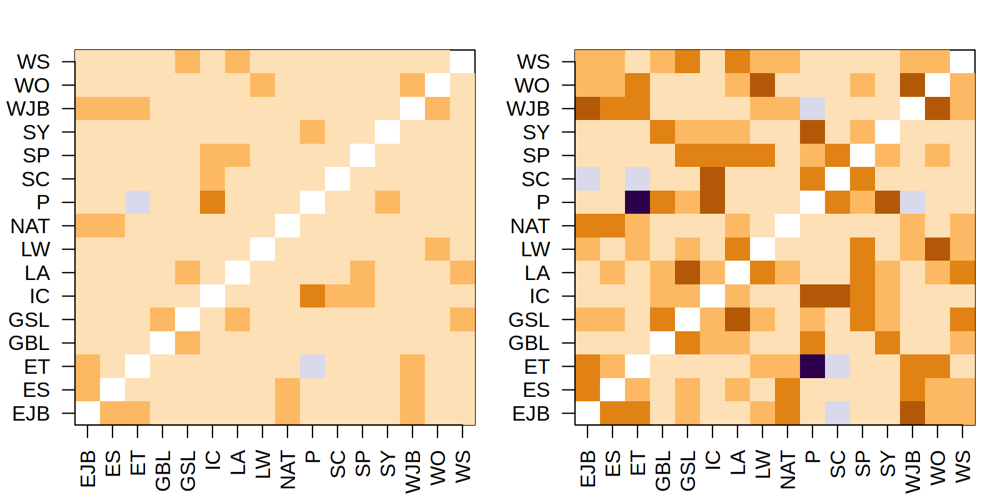

In [898]:
prep_window(c(1,2)); par(mar = c(3,3,2,1))
invisible(apply(chi2,1,function(chi) {
    image(chi, zlim = c(-1,1), breaks = seq(-1,1,0.2), col = rev(RColorBrewer:::brewer.pal(10,"PuOr")), xaxt = "n", yaxt = "n")
    axis(1, at = seq(0,1,length.out = 16), labels = hfrz_list, las = 2)
    axis(2, at = seq(0,1,length.out = 16), labels = hfrz_list, las = 2)
}))

# **Exploratory modelling of log(cumDSR)**

## **Log-linear models per HFRZ: cumDSR ~ gmst**

In [405]:
# load all the .csv files into a single list, take logs &  and merge into a dataframe
df_list <- sapply(list.files("ts", pattern = "cumDSR-fs", full.names = T), function(fnm) read.csv(fnm, col.names = c("year", gsub(".csv", "", strsplit(fnm, "_")[[1]][3]))), simplify = F)
df = cbind("year" = df_list[[1]][,"year"], log(do.call("cbind", lapply(df_list, "[",-1))))

# add GMST anomaly as covariate
gmst <- read.fwf("ts/gmst.dat", comment.char = "#", widths = c(5,15), col.names = c("year", "gmst"))
gmst$gmst <- gmst$gmst - gmst$gmst[gmst$year == 2023]
df <- merge(gmst, df)                  

In [453]:
fitted_models <- sapply(colnames(df)[3:18], function(cnm) { lm(paste0(cnm, " ~ gmst"), df) }, simplify = F)

### **Visualise fitted models**

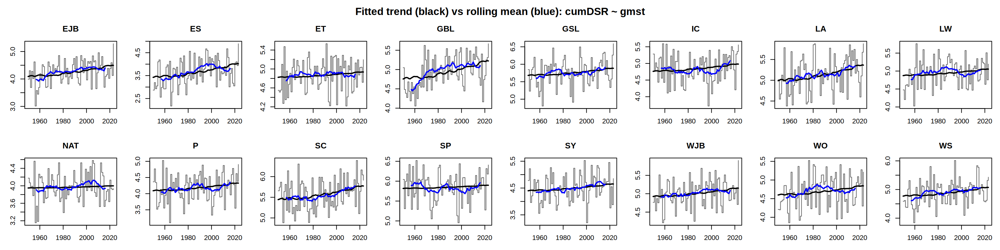

In [407]:
prep_window(c(1,4)); par(mfrow = c(2,8), mar = c(3,3,3,1), oma = c(0,0,2,0))
for (cnm in colnames(df)[3:18]) {
    y <- df[,cnm]
    plot(df$year, y, type = "s", main = cnm, col = adjustcolor("black", 0.6))
    lines(df$year, fitted_models[[cnm]]$fitted, col = "black", lwd = 2)
    lines(df$year, filter(y, rep(1/15,15), sides = 2), col = "blue", lwd = 2)
}
mtext("Fitted trend (black) vs rolling mean (blue): cumDSR ~ gmst", outer = T, font = 2)

### **Diagnostic plots**

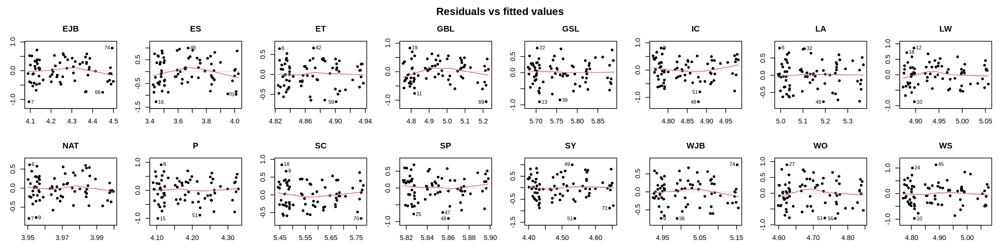

In [408]:
prep_window(c(1,4)); par(mfrow = c(2,8), mar = c(3,3,3,1), oma = c(0,0,2,0))
for (cnm in colnames(df)[3:18]) {
    plot(fitted_models[[cnm]], which = 1, main = cnm, caption = "", sub.caption = "")
}
mtext("Residuals vs fitted values", outer = T, font = 2)

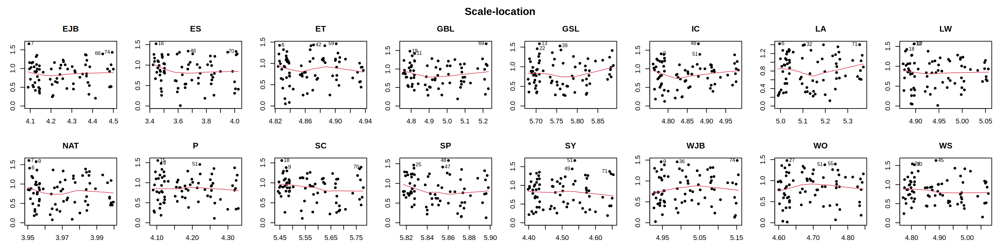

In [409]:
prep_window(c(1,4)); par(mfrow = c(2,8), mar = c(3,3,3,1), oma = c(0,0,2,0))
for (cnm in colnames(df)[3:18]) {
    plot(fitted_models[[cnm]], which = 3, main = cnm, caption = "", sub.caption = "")
}
mtext("Scale-location", outer = T, font = 2)
# Variance seems to be fairly stable

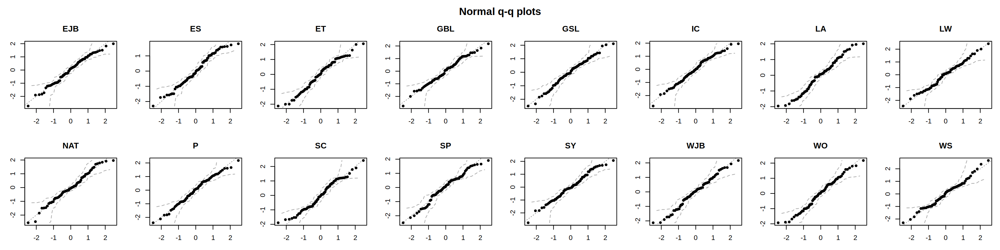

In [410]:
prep_window(c(1,4)); par(mfrow = c(2,8), mar = c(3,3,3,1), oma = c(0,0,2,0))
for (cnm in colnames(df)[3:18]) {
    qqnorm(scale(fitted_models[[cnm]]$res), main = cnm)
    abline(0,1, lty = 3, col = adjustcolor("black", 0.4))
    # plot(fitted_mdl, which = 2, main = cnm, caption = "", sub.caption = "")
}
mtext("Normal q-q plots", outer = T, font = 2)
# slightly heavy tails but nothing to worry about

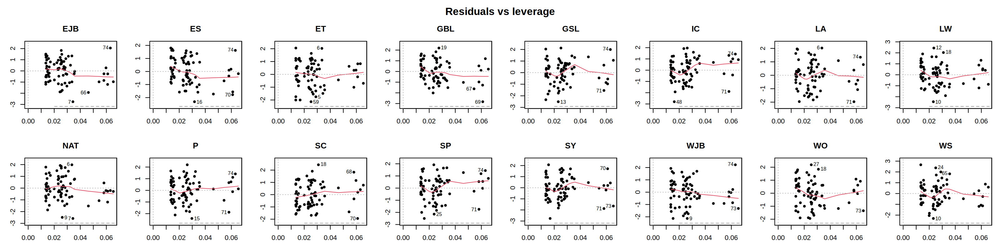

In [411]:
prep_window(c(1,4)); par(mfrow = c(2,8), mar = c(3,3,3,1), oma = c(0,0,2,0))
for (cnm in colnames(df)[3:18]) {
    plot(fitted_models[[cnm]], which = 5, main = cnm, caption = "", sub.caption = "")
}
mtext("Residuals vs leverage", outer = T, font = 2)
# No particularly high-influence points although point 74 (2023) is flagged as unusual in many regions

### **Model parameters**

In [322]:
# covariates and p-values
round(sapply(fitted_models, coef), 3)
sapply(fitted_models, function(mdl) summary(mdl)$coef[,4]) <= 0.005   

,EJB,ES,ET,GBL,GSL,IC,LA,LW,NAT,P,SC,SP,SY,WJB,WO,WS
(Intercept),4.494,4.018,4.936,5.223,5.885,4.980,5.365,5.054,3.999,4.326,5.773,5.897,4.650,5.151,4.842,5.072
gmst,0.378,0.556,0.105,0.437,0.191,0.204,0.351,0.169,0.046,0.221,0.308,0.075,0.235,0.212,0.228,0.282


,EJB,ES,ET,GBL,GSL,IC,LA,LW,NAT,P,SC,SP,SY,WJB,WO,WS
(Intercept),TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE
gmst,FALSE,FALSE,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE


In [329]:
# what is effect on GMST covariate of fitting to a shorter time series?
fitted_1991 <- sapply(colnames(df)[3:18], function(cnm) { lm(paste0(cnm, " ~ gmst"), df[df$year >= 1991,]) }, simplify = F)

round(sapply(fitted_1991, coef), 3)
sapply(fitted_1991, function(mdl) summary(mdl)$coef[,4]) <= 0.005
       
# less evidence of a trend when fitting to shorter time series

,EJB,ES,ET,GBL,GSL,IC,LA,LW,NAT,P,SC,SP,SY,WJB,WO,WS
(Intercept),4.384,3.758,4.930,5.043,5.894,5.115,5.341,5.014,3.936,4.356,5.857,5.991,4.633,5.092,4.801,4.978
gmst,0.000,-0.402,0.096,-0.189,0.172,0.714,0.289,0.131,-0.200,0.394,0.617,0.470,0.123,-0.011,0.192,-0.159


,EJB,ES,ET,GBL,GSL,IC,LA,LW,NAT,P,SC,SP,SY,WJB,WO,WS
(Intercept),TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE
gmst,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE


## **Log-linear models per HFRZ: cumDSR ~ gmst + ppa**

In [414]:
# load all the .csv files into a single list, take logs &  and merge into a dataframe
df_list <- sapply(list.files("ts", pattern = "cumDSR-fs", full.names = T), function(fnm) read.csv(fnm, col.names = c("year", gsub(".csv", "", strsplit(fnm, "_")[[1]][3]))), simplify = F)
df = cbind("year" = df_list[[1]][,"year"], log(do.call("cbind", lapply(df_list, "[",-1))))

# add GMST anomaly as covariate
gmst <- read.fwf("ts/gmst.dat", comment.char = "#", widths = c(5,15), col.names = c("year", "gmst"))
gmst$gmst <- gmst$gmst - gmst$gmst[gmst$year == 2023]
df <- merge(gmst, df)

# load PPA time series & merge into single df
ppa_list <- sapply(list.files("ts", pattern = "PPA-fs", full.names = T), function(fnm) read.csv(fnm, col.names = c("year", paste0("ppa_",gsub(".csv", "", strsplit(fnm, "_")[[1]][3])))), simplify = F)
ppa_df = cbind("year" = substr(ppa_list[[1]][,"year"],1,4), do.call("cbind", lapply(ppa_list, "[",-1)))
df <- merge(df, ppa_df)

In [415]:
fitted_models <- sapply(colnames(df)[3:18], function(cnm) { lm(paste0(cnm, " ~ gmst + ppa_",cnm), df) }, simplify = F)

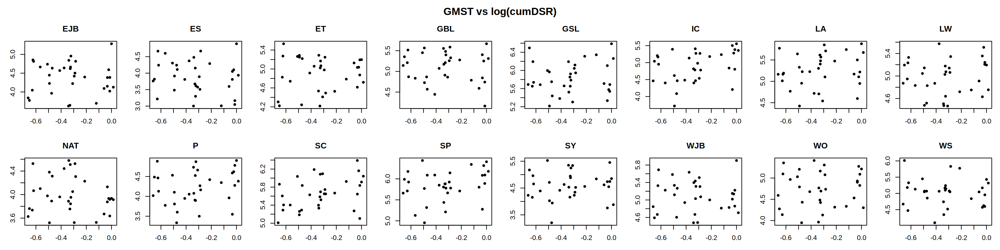

In [416]:
prep_window(c(1,4)); par(mfrow = c(2,8), mar = c(3,3,3,1), oma = c(0,0,2,0))
for (cnm in colnames(df)[3:18]) {
    plot(df$gmst, df[,cnm], main = cnm)
}
mtext("GMST vs log(cumDSR)", outer = T, font = 2)

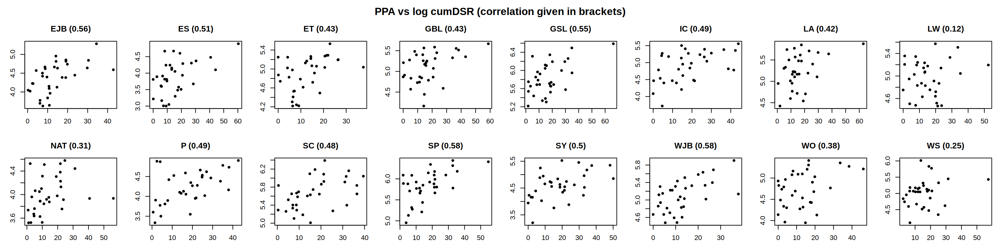

In [417]:
prep_window(c(1,4)); par(mfrow = c(2,8), mar = c(3,3,3,1), oma = c(0,0,2,0))
for (cnm in colnames(df)[3:18]) {
    x <- df[,paste0("ppa_",cnm)]
    y <- df[,cnm]
    plot(x, y, main = paste0(cnm, " (",round(cor(x,y),2),")"))
}
mtext("PPA vs log cumDSR (correlation given in brackets)", outer = T, font = 2)

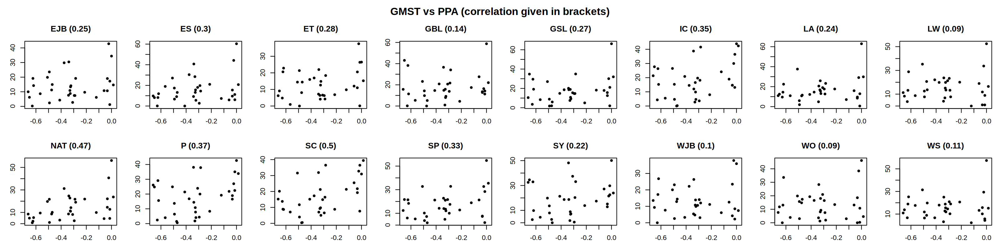

In [418]:
prep_window(c(1,4)); par(mfrow = c(2,8), mar = c(3,3,3,1), oma = c(0,0,2,0))
for (cnm in colnames(df)[3:18]) {
    x <- df$gmst
    y <- df[,paste0("ppa_",cnm)]
    plot(x, y, main = paste0(cnm, " (",round(cor(x,y),2),")"))
}
mtext("GMST vs PPA (correlation given in brackets)", outer = T, font = 2)

### **Visualise fitted models**

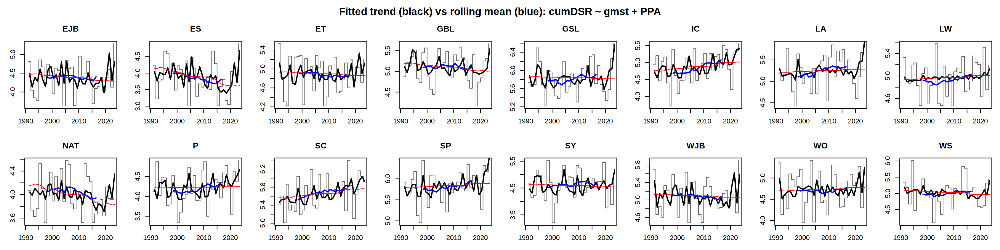

In [419]:
prep_window(c(1,4)); par(mfrow = c(2,8), mar = c(3,3,3,1), oma = c(0,0,2,0))
for (cnm in colnames(df)[3:18]) {
    y <- df[,cnm]
    plot(df$year, y, type = "s", main = cnm, col = adjustcolor("black", 0.6))
    lines(df$year+0.5, fitted_models[[cnm]]$fitted, col = "black", lwd = 2)
    lines(df$year+0.5, filter(y, rep(1/15,15), sides = 2), col = "blue", lwd = 2)
    lines(df$year+0.5, predict(fitted_models[[cnm]], setNames(data.frame(df$gmst, mean(df[,paste0("ppa_",cnm)])), c("gmst", paste0("ppa_",cnm)))), col = "red") # GMST component
}
mtext("Fitted trend (black) vs rolling mean (blue): cumDSR ~ gmst + PPA", outer = T, font = 2)

### **Diagnostic plots**

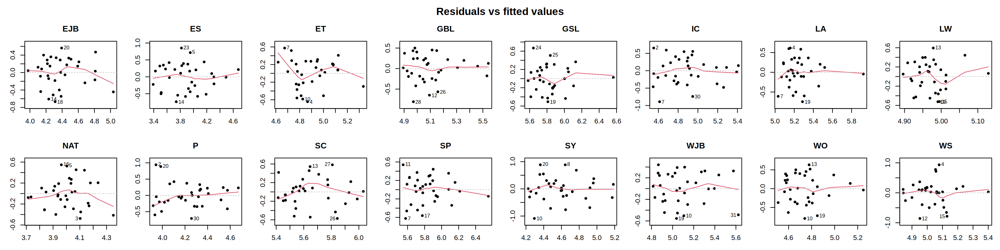

In [420]:
prep_window(c(1,4)); par(mfrow = c(2,8), mar = c(3,3,3,1), oma = c(0,0,2,0))
for (cnm in colnames(df)[3:18]) {
    plot(fitted_models[[cnm]], which = 1, main = cnm, caption = "", sub.caption = "")
}
mtext("Residuals vs fitted values", outer = T, font = 2)
# ET looks very odd, but otherwise generally ok

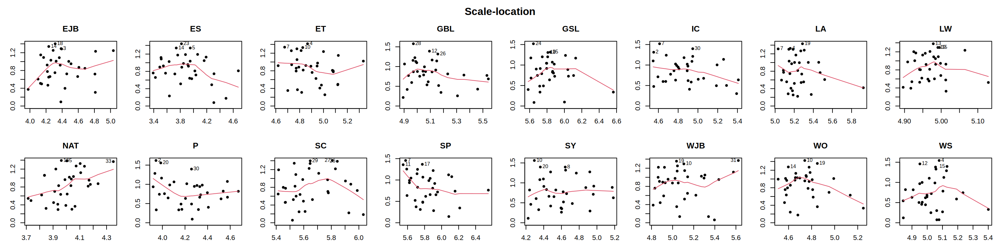

In [427]:
prep_window(c(1,4)); par(mfrow = c(2,8), mar = c(3,3,3,1), oma = c(0,0,2,0))
for (cnm in colnames(df)[3:18]) {
    plot(fitted_models[[cnm]], which = 3, main = cnm, caption = "", sub.caption = "")
}
mtext("Scale-location", outer = T, font = 2)
# Variance seems to be less stable than when only GMST was included

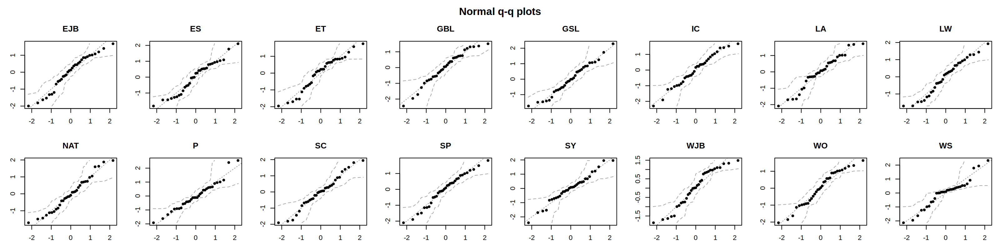

In [422]:
prep_window(c(1,4)); par(mfrow = c(2,8), mar = c(3,3,3,1), oma = c(0,0,2,0))
for (cnm in colnames(df)[3:18]) {
    qqnorm(scale(fitted_models[[cnm]]$res), main = cnm)
    abline(0,1, lty = 3, col = adjustcolor("black", 0.4))
    # plot(fitted_mdl, which = 2, main = cnm, caption = "", sub.caption = "")
}
mtext("Normal q-q plots", outer = T, font = 2)
# slightly heavy tails but nothing to worry about

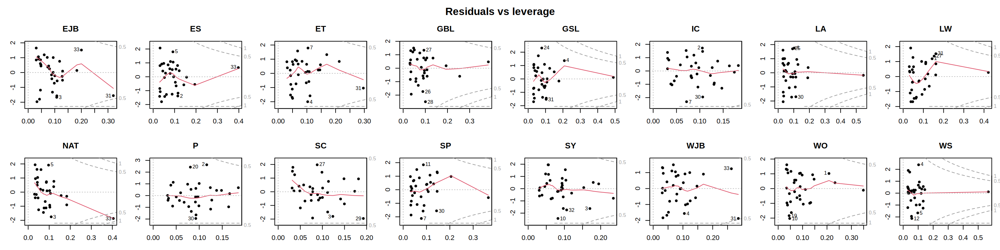

In [426]:
prep_window(c(1,4)); par(mfrow = c(2,8), mar = c(3,3,3,1), oma = c(0,0,2,0))
for (cnm in colnames(df)[3:18]) {
    plot(fitted_models[[cnm]], which = 5, main = cnm, caption = "", sub.caption = "")
}
mtext("Residuals vs leverage", outer = T, font = 2)
# some points with high leverage and a few (typically recent years, points 29-33) come close to having high influence

### **Model parameters**

In [293]:
# covariates and p-values
round(sapply(fitted_models, coef), 3)
sapply(fitted_models, function(mdl) summary(mdl)$coef[,4]) <= 0.005
       

,EJB,ES,ET,GBL,GSL,IC,LA,LW,NAT,P,SC,SP,SY,WJB,WO,WS
(Intercept),3.943,3.235,4.616,4.784,5.552,4.737,5.060,4.957,3.648,3.930,5.561,5.588,4.17,4.763,4.588,4.793
gmst,-0.288,-0.835,-0.118,-0.294,-0.071,0.399,0.112,0.116,-0.526,0.046,0.317,0.158,-0.15,-0.110,0.125,-0.213
ppa_EJB,0.025,0.024,0.019,0.013,0.015,0.015,0.014,0.003,0.013,0.017,0.012,0.018,0.02,0.023,0.014,0.011


,EJB,ES,ET,GBL,GSL,IC,LA,LW,NAT,P,SC,SP,SY,WJB,WO,WS
(Intercept),TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE
gmst,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
ppa_EJB,TRUE,TRUE,FALSE,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,TRUE,TRUE,TRUE,FALSE,FALSE


### **How well does GMST predict PPA?**

In [331]:
ppa_fitted <- sapply(colnames(df)[3:18], function(cnm) { lm(paste0("ppa_",cnm, " ~ gmst"), df) }, simplify = F)

In [401]:
# covariates and p-values
round(sapply(ppa_fitted, coef), 3)
sapply(ppa_fitted, function(mdl) summary(mdl)$coef[,4]) <= 0.005
       
# high uncertainty but definitely a positive relationship between PPA and GMST

,EJB,ES,ET,GBL,GSL,IC,LA,LW,NAT,P,SC,SP,SY,WJB,WO,WS
(Intercept),17.403,21.908,16.466,20.075,22.408,24.717,20.484,17.193,22.996,24.519,25.045,22.948,23.117,14.537,14.861,17.490
gmst,11.381,18.118,11.209,8.140,15.899,20.625,12.895,4.584,26.028,20.027,25.354,17.773,13.655,4.388,4.686,5.174


,EJB,ES,ET,GBL,GSL,IC,LA,LW,NAT,P,SC,SP,SY,WJB,WO,WS
(Intercept),TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE
gmst,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE


#### **Visualise fitted trend**

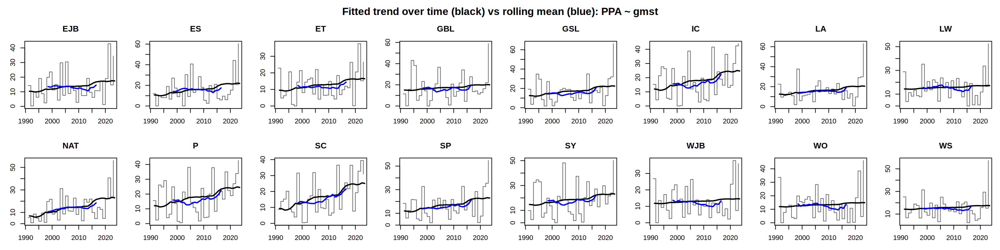

In [440]:
prep_window(c(1,4)); par(mfrow = c(2,8), mar = c(3,3,3,1), oma = c(0,0,2,0))
for (cnm in colnames(df)[3:18]) {
    y <- df[,paste0("ppa_",cnm)]
    plot(df$year, y, type = "s", main = cnm, col = adjustcolor("black", 0.6))
    lines(df$year+0.5, ppa_fitted[[cnm]]$fitted, col = "black", lwd = 2)
    lines(df$year+0.5, filter(y, rep(1/15,15), sides = 2), col = "blue", lwd = 2)
    # lines(df$year+0.5, predict(fitted_models[[cnm]], setNames(data.frame(df$gmst, mean(df[,paste0("ppa_",cnm)])), c("gmst", paste0("ppa_",cnm)))), col = "red") # GMST component
}
mtext("Fitted trend over time (black) vs rolling mean (blue): PPA ~ gmst", outer = T, font = 2)

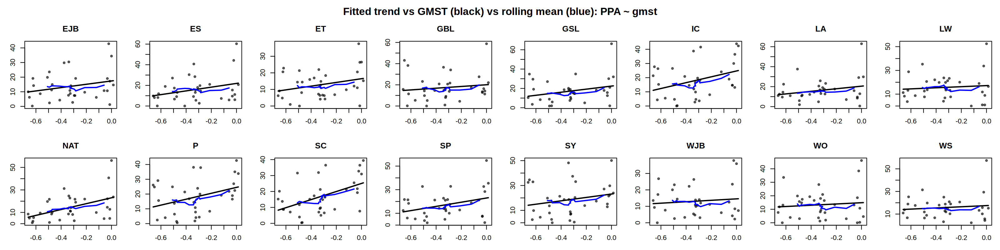

In [441]:
prep_window(c(1,4)); par(mfrow = c(2,8), mar = c(3,3,3,1), oma = c(0,0,2,0))
for (cnm in colnames(df)[3:18]) {
    y <- df[,paste0("ppa_",cnm)]
    plot(df$gmst, y, pch = 20, main = cnm, col = adjustcolor("black", 0.6))
    lines(df$gmst, ppa_fitted[[cnm]]$fitted, col = "black", lwd = 2)
    lines(df$gmst, filter(y, rep(1/15,15), sides = 2), col = "blue", lwd = 2)
    # lines(df$year+0.5, predict(fitted_models[[cnm]], setNames(data.frame(df$gmst, mean(df[,paste0("ppa_",cnm)])), c("gmst", paste0("ppa_",cnm)))), col = "red") # GMST component
}
mtext("Fitted trend vs GMST (black) vs rolling mean (blue): PPA ~ gmst", outer = T, font = 2)

#### **Diagnostic plots**

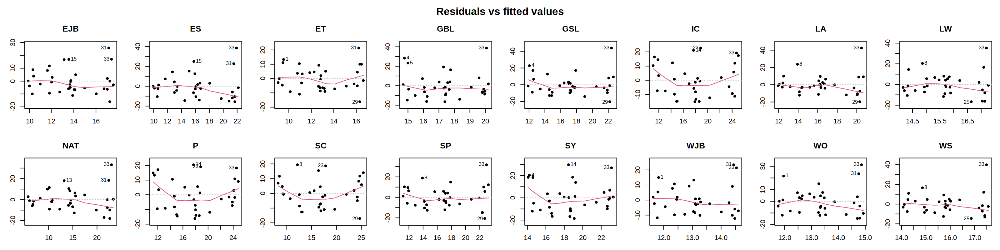

In [429]:
prep_window(c(1,4)); par(mfrow = c(2,8), mar = c(3,3,3,1), oma = c(0,0,2,0))
for (cnm in colnames(df)[3:18]) {
    plot(ppa_fitted[[cnm]], which = 1, main = cnm, caption = "", sub.caption = "")
}
mtext("Residuals vs fitted values", outer = T, font = 2)

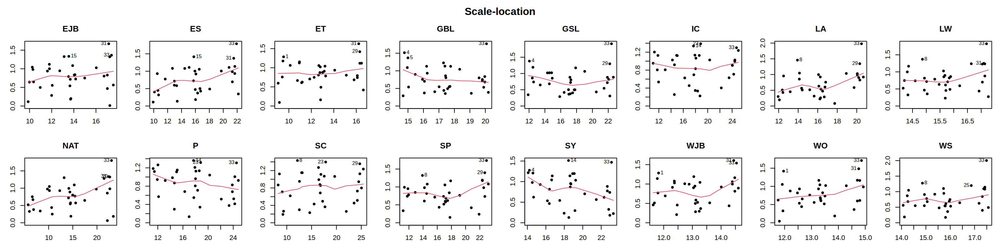

In [430]:
prep_window(c(1,4)); par(mfrow = c(2,8), mar = c(3,3,3,1), oma = c(0,0,2,0))
for (cnm in colnames(df)[3:18]) {
    plot(ppa_fitted[[cnm]], which = 3, main = cnm, caption = "", sub.caption = "")
}
mtext("Scale-location", outer = T, font = 2)
# Variance seems to be fairly stable

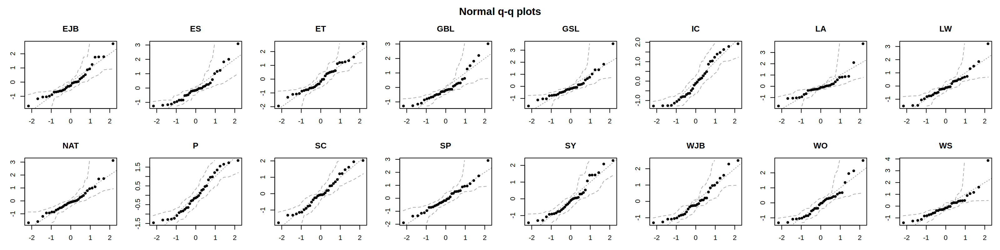

In [433]:
prep_window(c(1,4)); par(mfrow = c(2,8), mar = c(3,3,3,1), oma = c(0,0,2,0))
for (cnm in colnames(df)[3:18]) {
    qqnorm(scale(ppa_fitted[[cnm]]$res), main = cnm)
    abline(0,1, lty = 3, col = adjustcolor("black", 0.4))
    # plot(fitted_mdl, which = 2, main = cnm, caption = "", sub.caption = "")
}
mtext("Normal q-q plots", outer = T, font = 2)
# rather less Gaussian than the logcumDSR - might need to rethink form if using

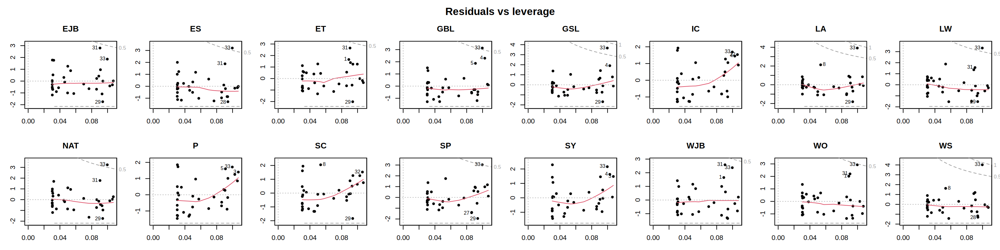

In [436]:
prep_window(c(1,4)); par(mfrow = c(2,8), mar = c(3,3,3,1), oma = c(0,0,2,0))
for (cnm in colnames(df)[3:18]) {
    plot(ppa_fitted[[cnm]], which = 5, main = cnm, caption = "", sub.caption = "")
}
mtext("Residuals vs leverage", outer = T, font = 2)
# 2023 (labelled 33) has very high influence in several regions - consider removing when fitting

### **Use detrended PPA residuals to predict DSR**

- can we use GMST to predict the fitted PPA, then use the residuals to predict the DSR (essentially detrending the PPA)

In [458]:
# model using GMST only
gmst_models <- sapply(colnames(df)[3:18], function(cnm) { lm(paste0(cnm, " ~ gmst"), df) }, simplify = F)

# model using PPA & GMST
fitted_models <- sapply(colnames(df)[3:18], function(cnm) { lm(paste0(cnm, " ~ gmst + ppa_",cnm), df) }, simplify = F)

# model using PPA residuals
resid_models <- sapply(colnames(df)[3:18], function(cnm) { 
    ppa_resid <- lm(paste0("ppa_",cnm, " ~ gmst"), df)$resid
    df_resid <- cbind(df[,c("gmst", cnm)], ppa_resid)
    lm(paste0(cnm, " ~ gmst + ppa_resid"), df_resid)
}, simplify = F)

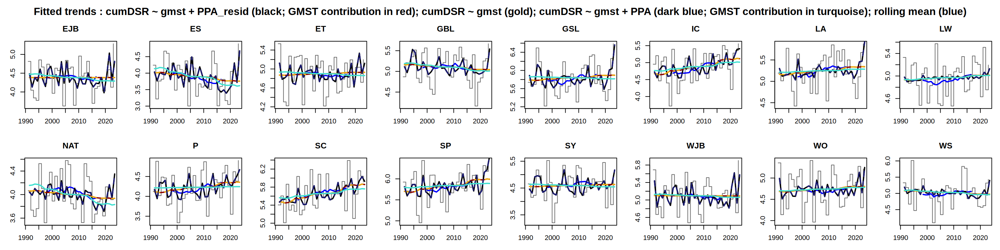

In [469]:
prep_window(c(1,4)); par(mfrow = c(2,8), mar = c(3,3,3,1), oma = c(0,0,2,0))
for (cnm in colnames(df)[3:18]) {
    
    y <- df[,cnm]
    plot(df$year, y, type = "s", main = cnm, col = adjustcolor("black", 0.6))
    lines(df$year+0.5, filter(y, rep(1/15,15), sides = 2), col = "blue", lwd = 2)

    lines(df$year+0.5, resid_models[[cnm]]$fitted, col = "black", lwd = 2)
    lines(df$year+0.5, predict(resid_models[[cnm]], data.frame("gmst" = df$gmst, "ppa_resid" = 0)), col = "red4", lwd = 2) # total GMST contribution (direct & via PPA)
    
    lines(df$year+0.5, gmst_models[[cnm]]$fitted, col = "darkgoldenrod2", lwd = 2, lty = 2) # unmodified GMST contribution

    lines(df$year+0.5, fitted_models[[cnm]]$fitted, col = "midnightblue", lwd = 2, lty = 2) # total fitted model is identical to residual model
    lines(df$year+0.5, predict(fitted_models[[cnm]], setNames(data.frame(df$gmst, mean(df[,paste0("ppa_",cnm)])), c("gmst", paste0("ppa_",cnm)))), col = "turquoise", lwd = 2) # GMST constribution excluding via PPA
}
mtext("Fitted trends : cumDSR ~ gmst + PPA_resid (black; GMST contribution in red); cumDSR ~ gmst (gold); cumDSR ~ gmst + PPA (dark blue; GMST contribution in turquoise); rolling mean (blue)", outer = T, font = 2)

## **Mixed effects model: cumDSR ~ gmst | hfrz**
- can we fit a single model to all regions, treating the HFRZ as a random effect?

In [582]:
suppressMessages(library(lme4))

In [584]:
# load all the .csv files into a single list, take logs &  and merge into a dataframe
hfrz_list <- sapply(strsplit(gsub(".csv", "", list.files("ts", pattern = "cumDSR-fs")), "_"), "[", 3)

df_list <- sapply(hfrz_list, function(znm) cbind("hfrz" = znm, read.csv(paste0("ts/era5_cumDSR-fs_",znm,".csv"), col.names = c("year", "cumDSR"))), simplify = F)
df <- do.call("rbind", df_list)

# add GMST anomaly as covariate
gmst <- read.fwf("ts/gmst.dat", comment.char = "#", widths = c(5,15), col.names = c("year", "gmst"))
gmst$gmst <- gmst$gmst - gmst$gmst[gmst$year == 2023]
df <- merge(df, gmst)
df <- df[order(df$hfrz),]
df$cumDSR <- log(df$cumDSR)

In [585]:
# doesn't really look like there's a clear pattern, but let's try it...
mem_gmst <- lmer(cumDSR ~ gmst + (1 | hfrz), data = df)

# also fit individual fixed-effect models
fem_gmst <- sapply(hfrz_list, function(z) { lm(cumDSR ~ gmst, df[df$hfrz == z,]) }, simplify = F)

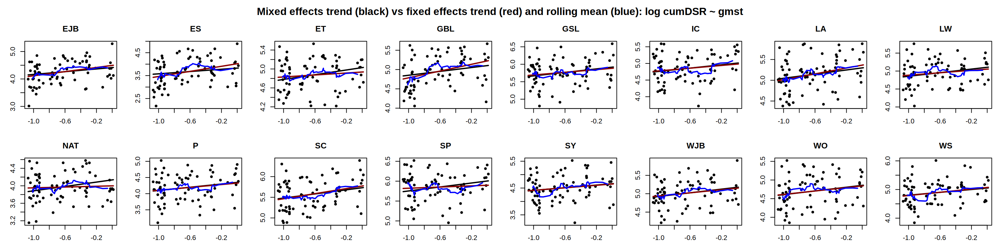

In [588]:
# actually not a bad fit for most regions (except for North Atlantic, NAT)
prep_window(c(1,4)); par(mfrow = c(2,8), mar = c(3,3,3,1), oma = c(0,0,2,0))
for (z in hfrz_list) {
    
    df_z = df[df$hfrz == z,]
    
    plot(df_z$gmst, df_z$cumDSR, pch = 20, main = z)
    lines(df_z$gmst, fitted(mem_gmst)[df$hfrz == z], lwd = 2)
    
    lines(df_z$gmst, fem_gmst[[z]]$fitted, col = "red4", lwd = 2)
    lines(df_z$gmst[order(df_z$gmst)], filter(df_z$cumDSR[order(df_z$gmst)], rep(1/15,15), sides = 2), col = "blue", lwd = 2)
}
mtext("Mixed effects trend (black) vs fixed effects trend (red) and rolling mean (blue): log cumDSR ~ gmst", outer = T, font = 2)

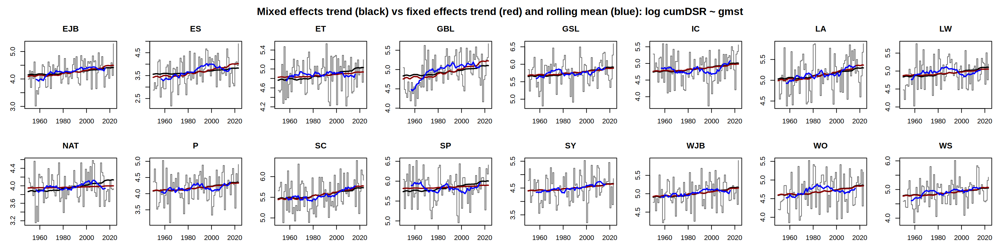

In [603]:
# actually not a bad fit for most regions (except for North Atlantic, NAT)
prep_window(c(1,4)); par(mfrow = c(2,8), mar = c(3,3,3,1), oma = c(0,0,2,0))
for (z in hfrz_list) {
    
    df_z = df[df$hfrz == z,]
    
    plot(df_z$year, df_z$cumDSR, type = "s", main = z, col = adjustcolor("black", 0.6))
    lines(df_z$year, fitted(mem_gmst)[df$hfrz == z], lwd = 2)

    lines(df_z$year, fem_gmst[[z]]$fitted, col = "red4", lwd = 2)    
    lines(df_z$year, filter(df_z$cumDSR, rep(1/15,15), sides = 2), col = "blue", lwd = 2)
}
mtext("Mixed effects trend (black) vs fixed effects trend (red) and rolling mean (blue): log cumDSR ~ gmst", outer = T, font = 2)

In [629]:
prep_window(c(1,2))
plot(unlist(ranef(mem_gmst)), sapply(fem_gmst, function(mdl) mdl$coef[1]))
plot(unlist(ranef(mem_gmst)), sapply(fem_gmst, function(mdl) mdl$coef[2]))

In [639]:
mem_slope <- lmer(cumDSR ~ (gmst | hfrz), data = df)

In [640]:
summary(mem_slope)

Linear mixed model fit by REML ['lmerMod']
Formula: cumDSR ~ (gmst | hfrz)
   Data: df

REML criterion at convergence: 1295.8

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-3.3238 -0.7025  0.0450  0.6895  2.8117 

Random effects:
 Groups   Name        Variance Std.Dev. Corr 
 hfrz     (Intercept) 0.37753  0.6144        
          gmst        0.06001  0.2450   -0.51
 Residual             0.16015  0.4002        
Number of obs: 1184, groups:  hfrz, 16

Fixed effects:
            Estimate Std. Error t value
(Intercept)    5.180      0.145   35.72

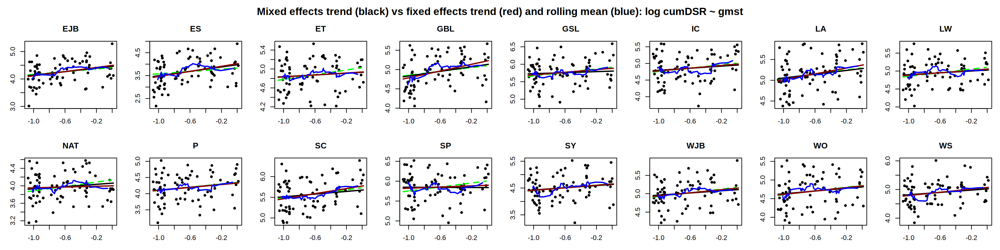

In [641]:
# actually not a bad fit for most regions (except for North Atlantic, NAT)
prep_window(c(1,4)); par(mfrow = c(2,8), mar = c(3,3,3,1), oma = c(0,0,2,0))
for (z in hfrz_list) {
    
    df_z = df[df$hfrz == z,]
    
    plot(df_z$gmst, df_z$cumDSR, pch = 20, main = z)
    lines(df_z$gmst, fitted(mem_gmst)[df$hfrz == z], lwd = 2, col = "green", lty =2)
    lines(df_z$gmst, fitted(mem_slope)[df$hfrz == z], lwd = 2)
    
    lines(df_z$gmst, fem_gmst[[z]]$fitted, col = "red4", lwd = 2)
    lines(df_z$gmst[order(df_z$gmst)], filter(df_z$cumDSR[order(df_z$gmst)], rep(1/15,15), sides = 2), col = "blue", lwd = 2)
}
mtext("Mixed effects trend (black) vs fixed effects trend (red) and rolling mean (blue): log cumDSR ~ gmst", outer = T, font = 2)

### **Comparison of fitted trend in GMST**

In [738]:
nsamp <- 100

# create empty lists to hold results
mem_coef <- fem_coef <- list()

set.seed(42)
for (i in 1:nsamp) {
    
    ysamp <- sample(74, replace = T)
    boot_df <- df[(74 * rep(0:15, each = 74)) + rep(ysamp, 16),]
    
    mem_boot <- lmer(cumDSR ~ (1 + gmst | hfrz), data = boot_df)
    fem_boot <- sapply(hfrz_list, function(z) { lm(cumDSR ~ gmst, boot_df[boot_df$hfrz == z,]) }, simplify = F)
    
    mem_coef[[i]] <- t(coef(mem_boot)$hfrz)
    fem_coef[[i]] <- sapply(fem_boot, coef)
}
mem_coef <- abind(mem_coef, along = 0)
fem_coef <- abind(fem_coef, along = 0)

boundary (singular) fit: see help('isSingular')



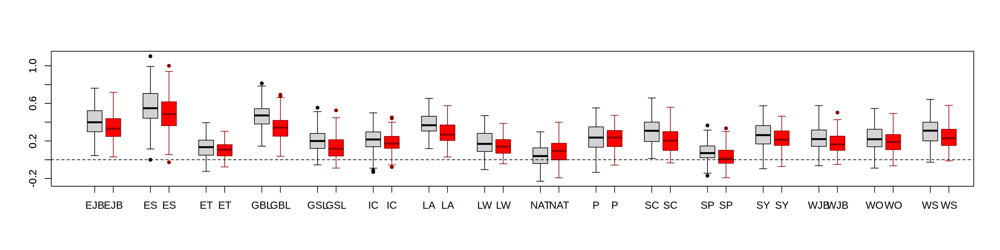

In [755]:
# Definitely evidence for different slopes in different regions - don't think it makes sense to try to fit a single model for all of Canada
boxplot(fem_coef[,"gmst",], at = seq(1,48,3), pch = 20, lty = 1)
boxplot(mem_coef[,"gmst",], add = T, at = seq(1,48,3) + 1, pch = 20, lty = 1, col = "red", border = "darkred", labels = NA)
abline(h = 0, lty = 2)

---
---
# **Earlier noodlings**
---
---


# **Linear trend in log10_cumDSR**

## **log10_cumDSR per HFRZ**

### **Prep data**

In [16]:
# load data
gmst <- read.fwf("/home/clair/Data/gmst.dat", comment.char = "#", widths = c(5,15), col.names = c("year", "gmst"))
cdsr <- read.csv("data/era5_cdsr.csv")

# take base10 log of DSR as in original study
log10_cdsr <- sapply(colnames(cdsr)[-1], function(cnm) log10(cdsr[,cnm]))
colnames(log10_cdsr) <- paste0("log10_", colnames(log10_cdsr))       
log10_cdsr <- data.frame("year" = cdsr$year, log10_cdsr)
                     
# merge into single dataframe
df <- merge(gmst, log10_cdsr)

### **Check distribution of log10_cumDSR**

In [3]:
prep_window(c(4,4))
x <- seq(0.6,3,0.01)

jpeg("fig/expl_era5_cdsr-fit.jpg", width = 480 * 3, height = 480 * 2); par(mfrow = c(4,4), lwd = 2, cex = 1.2, mar = c(3,3,2,1)); {
    invisible(sapply(colnames(df)[-(1:2)], function(cnm) { 
        ts <- df[,cnm]
        hist(ts, prob = T, xlim = c(0.8,3), ylim = c(0,3), main = cnm, xlab = "", ylab = "")
        lines(density(ts))
        lines(x, dnorm(x, mean(ts), sd(ts)), col = "blue")
    }))
}; dev.off()

png 
  2

### **Fit linear trend model**

In [17]:
models <- sapply(colnames(df)[-(1:2)], function(cnm) fit_ns("norm", "shift", df, cnm, "gmst", lower = F), simplify = F)
gmst_2023 <- gmst[gmst$year == 2023, "gmst"]
gmst_hist <- gmst_2023 - 1.2

In [4]:
res <- sapply(models, function(mdl) mdl_ests(mdl, cov = gmst_2023, cov_cf = gmst_hist, ev = mdl$ev))

In [10]:
res[c("mu0", "alpha", "sigma0"),]

,log10_EJB,log10_ES,log10_ET,log10_GBL,log10_GSL,log10_IC,log10_LA,log10_LW,log10_NAT,log10_P,log10_SC,log10_SP,log10_SY,log10_WJB,log10_WO,log10_WS
mu0,1.7706601,1.4852844,2.0648489,2.0689752,2.48391102,2.08079934,2.2010444,2.10729064,1.68624332,1.78207481,2.3616798,2.534200256,1.9098785,2.1259144,1.9871093,2.0686211
alpha,0.1844718,0.2715079,0.0705635,0.2186396,0.06273564,0.07145091,0.1209055,0.08404658,0.03979895,0.09941973,0.1342584,-0.005470569,0.1175365,0.1126802,0.1153882,0.1423676
sigma0,0.1727815,0.2372574,0.1458640,0.1663821,0.15573033,0.18842426,0.1744042,0.16007508,0.14217505,0.18291477,0.1579131,0.165353315,0.2026454,0.1481913,0.1797439,0.1810322


In [6]:
write.csv(res, file = "res/cdsr_lineartrend-ests.csv")

In [7]:
prep_window(c(4,4))

jpeg("fig/expl_era5_cdsr-trend.jpg", width = 480 * 3, height = 480 * 2); par(mfrow = c(4,4), lwd = 2, cex = 1.2, mar = c(3,3,2,1)); {
    invisible(lapply(models, function(mdl) { 
        plot_trend(mdl, legend_pos = NA, main = mdl$varnm)
        lines(df$year, filter(mdl$x, rep(1/15,15), sides = 2), col = "forestgreen", lwd = 2)
    }))
}; dev.off()

png 
  2

In [8]:
prep_window(c(4,4))

jpeg("fig/expl_era5_cdsr-gmsttrend.jpg", width = 480 * 3, height = 480 * 2); par(mfrow = c(4,4), lwd = 2, cex = 1.2, mar = c(3,3,2,1)); {
    invisible(lapply(models, function(mdl) { 
        plot_gmsttrend(mdl, legend_pos = NA, main = mdl$varnm, cov = gmst_2023, cov_cf = gmst_hist)
        lines(df$gmst[order(df$gmst)], filter(mdl$x[order(df$gmst)], rep(1/15,15), sides = 2), col = "forestgreen", lwd = 2)
    }))
}; dev.off()

png 
  2

In [9]:
prep_window(c(4,4))

jpeg("fig/expl_era5_cdsr-rlplots.jpg", width = 480 * 3, height = 480 * 2); par(mfrow = c(4,4), lwd = 2, cex = 1.2, mar = c(3,3,2,1)); {
    invisible(lapply(models, function(mdl) { 
        plot_returnlevels(mdl, legend_pos = NA, main = mdl$varnm, cov = gmst_2023, cov_cf = gmst_hist)
    }))
}; dev.off()

### **Estimated return periods**

In [18]:
models <- sapply(colnames(df)[-(1:2)], function(cnm) fit_ns("norm", "shift", df, cnm, "gmst", lower = F), simplify = F)
gmst_2023 <- gmst[gmst$year == 2023, "gmst"]
gmst_hist <- gmst_2023 - 1.2

In [25]:
boots <- lapply(models, function(mdl) boot_ci(mdl, cov = gmst_2023, cov_cf = gmst_hist, ev = mdl$ev))

In [31]:
round(sapply(boots, "[", "return_period",)[,(1:8)], 2)

,log10_EJB,log10_ES,log10_ET,log10_GBL,log10_GSL,log10_IC,log10_LA,log10_LW
bestimate,41.64,20.01,4.17,8.28,43.41,11.38,11.06,2.99
2.5%,14.31,7.56,2.63,3.93,14.68,5.82,5.59,2.09
97.5%,195.12,74.30,7.84,22.78,237.70,31.87,27.81,5.01


In [30]:
round(sapply(boots, "[", "return_period",)[,(9:16)], 2)

,log10_NAT,log10_P,log10_SC,log10_SP,log10_SY,log10_WJB,log10_WO,log10_WS
bestimate,1.58,12.04,3.03,12.52,3.06,75.80,5.85,4.85
2.5%,1.25,5.97,2.02,6.76,1.92,24.53,3.43,2.78
97.5%,2.13,39.77,5.57,31.70,6.52,547.92,12.72,10.13


### **Change in intensity**

In [33]:
round(sapply(boots, "[", "dI_rel",)[,(1:8)], 2)

,log10_EJB,log10_ES,log10_ET,log10_GBL,log10_GSL,log10_IC,log10_LA,log10_LW
bestimate,66.48,111.74,21.53,82.96,18.93,21.83,39.66,26.14
2.5%,21.47,36.57,-3.82,32.53,-8.64,-12.90,3.91,-4.69
97.5%,122.84,219.30,49.74,155.30,62.15,69.94,94.42,62.81


In [34]:
round(sapply(boots, "[", "dI_rel",)[,(9:16)], 2)

,log10_NAT,log10_P,log10_SC,log10_SP,log10_SY,log10_WJB,log10_WO,log10_WS
bestimate,11.62,31.61,44.91,-1.50,38.37,36.53,37.55,48.20
2.5%,-11.73,-3.82,9.63,-24.41,-7.73,4.68,3.75,10.45
97.5%,47.07,86.12,94.10,28.11,102.05,75.41,83.69,107.53


### **Probability ratio**

In [36]:
round(sapply(boots, "[", "PR",)[,(1:8)], 2)

,log10_EJB,log10_ES,log10_ET,log10_GBL,log10_GSL,log10_IC,log10_LA,log10_LW
bestimate,42.85,39.32,2.42,40.27,3.49,2.49,6.03,2.31
2.5%,3.88,4.24,0.84,4.50,0.47,0.50,1.22,0.85
97.5%,633.28,642.82,6.79,781.92,40.65,14.55,57.99,6.93


In [37]:
round(sapply(boots, "[", "PR",)[,(9:16)], 2)

,log10_NAT,log10_P,log10_SC,log10_SP,log10_SY,log10_WJB,log10_WO,log10_WS
bestimate,1.26,3.99,4.58,0.93,2.59,15.25,4.01,5.30
2.5%,0.76,0.81,1.39,0.25,0.78,1.58,1.15,1.48
97.5%,2.24,25.66,22.41,3.60,9.17,201.81,17.92,30.40


## **log10_cumDSR over all HFRZs**

### **Prep data**

In [20]:
# load data
gmst <- read.fwf("/home/clair/Data/gmst.dat", comment.char = "#", widths = c(5,15), col.names = c("year", "gmst"))
gmst$gmst <- gmst$gmst - gmst[gmst$year == 2023, "gmst"]

cdsr <- read.csv("data/era5_cdsr-canada.csv")
df <- merge(gmst, cdsr)
df$log10_cdsr <- log10(df$cdsr)

### **Linear model**

In [21]:
mdl <- fit_ns("norm", "shift", df, "log10_cdsr", "gmst", lower = F)

gmst_2023 <- gmst[gmst$year == 2023, "gmst"]
gmst_hist <- gmst_2023 - 1.2

In [28]:
prep_window(c(1,3))

jpeg("fig/expl_era5_cdsr-gmsttrend_canada.jpg", height = 480, width = 480*4); par(mfrow = c(1,3), lwd = 2, cex = 1.2, mar = c(3,3,2,1)); {
    
    plot_trend(mdl, main = "Trend in cumDSR over time")
    lines(df$year, filter(mdl$x, rep(1/15,15), sides = 2), col = "forestgreen", lwd = 2)
    
    plot_gmsttrend(mdl, cov = gmst_2023, cov_cf = gmst_hist)
    lines(df$gmst[order(df$gmst)], filter(mdl$x[order(df$gmst)], rep(1/15,15), sides = 2), col = "forestgreen", lwd = 2)
    
    plot_returnlevels(mdl, cov = gmst_2023, cov_cf = gmst_hist)
    
}; dev.off()

png 
  2

In [31]:
t(round(boot_ci(mdl, cov = gmst_2023, cov_cf = gmst_hist, ev = mdl$ev), 3))[,-c(4,5,8)]

,mu0,sigma0,alpha,return_period,PR,dI_rel
bestimate,6.421,0.094,0.085,48.663,22.701,26.363
2.5%,6.380,0.081,0.024,16.618,2.366,6.834
97.5%,6.463,0.107,0.147,212.340,385.090,50.285


---
## **Sensitivity to start of time series (ERA5)**

In [10]:
# load data
gmst <- read.fwf("/home/clair/Data/gmst.dat", comment.char = "#", widths = c(5,15), col.names = c("year", "gmst"))
cdsr <- read.csv("data/era5_cdsr.csv")

# take base10 log of DSR as in original study
log10_cdsr <- sapply(colnames(cdsr)[-1], function(cnm) log10(cdsr[,cnm]))
colnames(log10_cdsr) <- paste0("log10_", colnames(log10_cdsr))       
log10_cdsr <- data.frame("year" = cdsr$year, log10_cdsr)
                     
# merge into single dataframe
df <- merge(gmst, log10_cdsr)
                     
# fit all the models, also excluding years prior to 1950/1960
models_1940 <- sapply(colnames(df)[-(1:2)], function(cnm) fit_ns("norm", "shift", df[df$year >= 1940,], cnm, "gmst", lower = F), simplify = F)
models_1950 <- sapply(colnames(df)[-(1:2)], function(cnm) fit_ns("norm", "shift", df[df$year >= 1950,], cnm, "gmst", lower = F), simplify = F)
models_1960 <- sapply(colnames(df)[-(1:2)], function(cnm) fit_ns("norm", "shift", df[df$year >= 1960,], cnm, "gmst", lower = F), simplify = F)

gmst_2023 <- gmst[gmst$year == 2023, "gmst"]
gmst_hist <- gmst_2023 - 1.2

In [11]:
prep_window(c(4,4))

jpeg("fig/expl-sa_era5_cdsr-trend_start-sensitivity.jpg", width = 480 * 3, height = 480 * 2); par(mfrow = c(4,4), lwd = 2, cex = 1.2, mar = c(3,3,2,1)); {
    invisible(sapply(1:16, function(i) {    
        plot(df$year, df[,-(1:2)][,i], type = "S", main = models_1940[[i]]$varnm)

        lines(models_1940[[i]]$data$year, ns_pars(models_1940[[i]])$loc)
        lines(models_1950[[i]]$data$year, ns_pars(models_1950[[i]])$loc, col = "darkblue")
        lines(models_1960[[i]]$data$year, ns_pars(models_1960[[i]])$loc, col = "darkred")
        
        lines(df$year, filter(models_1940[[i]]$x, rep(1/15,15), sides = 2), col = "forestgreen", lwd = 2)

    }))
}; dev.off()

png 
  2

In [12]:
prep_window(c(4,4))

jpeg("fig/expl-sa_era5_cdsr-gmsttrend_start-sensitivity.jpg", width = 480 * 3, height = 480 * 2); par(mfrow = c(4,4), lwd = 2, cex = 1.2, pch = 20, mar = c(3,3,2,1)); {
    invisible(sapply(1:16, function(i) {    
        plot(df$gmst, df[,-(1:2)][,i], main = models_1940[[i]]$varnm, ylab = models_1940[[i]]$varnm)

        lines(models_1940[[i]]$data$gmst, ns_pars(models_1940[[i]])$loc)
        lines(models_1950[[i]]$data$gmst, ns_pars(models_1950[[i]])$loc, col = "darkblue")
        lines(models_1960[[i]]$data$gmst, ns_pars(models_1960[[i]])$loc, col = "darkred")
        
        lines(df$gmst, eff_return_level(6, models_1940[[i]], fixed_cov = df$gmst))
        lines(df$gmst, eff_return_level(6, models_1950[[i]], fixed_cov = df$gmst), col = "darkblue")
        lines(df$gmst, eff_return_level(6, models_1960[[i]], fixed_cov = df$gmst), col = "darkred")
        
        lines(df$gmst[order(df$gmst)], filter(models_1940[[i]]$x[order(df$gmst)], rep(1/15,15), sides = 2), col = "forestgreen", lwd = 2)
        points(df[df$year == 2023, c("gmst", models_1940[[i]]$varnm)], pch = 0, col = "magenta", lwd = 2)

    }))
}; dev.off()

png 
  2